<a href="https://colab.research.google.com/github/robotlover2/deeplearning26.08.10/blob/main/02_OpenCV_%EC%9D%B4%EB%AF%B8%EC%A7%80%EC%A0%84%EC%B2%98%EB%A6%AC_ipynb%EC%9D%98_%EC%82%AC%EB%B3%B8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# OpenCV로 배우는 이미지 전처리 (학생용 실습본)
## — 딥러닝 모델에 넣을 수 있는 이미지 만들기

---

### 학습 목표

- OpenCV로 이미지를 읽고 출력하고 저장하며, **BGR과 RGB의 차이**를 설명할 수 있다.
- 색공간 변환(그레이스케일·HSV)과 **크기 조정(resize)** 을 수행할 수 있다.
- 자르기 · 반전 · 회전 · 이동 등 **기하 변환**을 적용할 수 있다.
- 노이즈 제거와 이진화, 엣지 검출이 **각각 어떤 상황에 필요한지** 판단할 수 있다.
- 픽셀 값을 **정규화**하고 **데이터 증강**을 적용해 학습 데이터를 늘릴 수 있다.
- 위 과정을 **하나의 전처리 함수로 묶어** 모델 입력을 만들 수 있다.

### 진행 순서

| 순서 | 내용 |
|---|---|
| 0 | 실습 환경 준비 |
| 1 | 이미지 읽기 · 출력 · 저장 (BGR vs RGB) |
| 2 | 색공간 변환과 크기 조정 |
| 3 | 기하 변환 : 자르기 · 반전 · 회전 · 이동 |
| 4 | 노이즈 제거와 이진화 — 필요한 만큼만 |
| 5 | 엣지 검출 — Canny 중심 |
| 6 | **정규화 : 모델이 먹을 수 있는 형태로** |
| 7 | **데이터 증강 : 한 장을 여러 장으로** |
| 8 | **전처리 파이프라인 함수로 묶기** |
| 9 | 정리 및 다음 차시 예고 |
| 부록 | 적응형 이진화 · Sobel/Laplacian · 패치 분할 · 이미지 합성 | 선택 | — |

> **이 노트북의 목적지**
> 마지막 8절에서 만드는 `preprocess()` 함수 한 개가 오늘의 결과물이다.
> 2일차 CNN, 3일차 YOLO에서 데이터를 다룰 때 이 함수의 구조가 그대로 반복된다.

## 이 노트북 사용법 — 학생용 실습본

이 파일은 **핵심 코드가 빈칸(`____`)으로 비워진 실습본**이다.
수업 중 강사의 설명을 들으며 빈칸을 직접 채워 넣는다.

### 진행 방법

1. 코드 셀 위쪽의 **`채울 곳`** 안내 블록을 먼저 읽는다.
2. 코드 안의 `____` 를 찾아 알맞은 값·함수 이름으로 바꾼다. 각 빈칸에는 `①` `②` 번호가 붙어 있다.
3. `Shift + Enter` 로 셀을 실행한다.

### 실행하면 이런 오류가 난다면

| 오류 메시지 | 원인 |
|---|---|
| `NameError: name '____' is not defined` | 아직 채우지 않은 빈칸이 남아 있다 |
| `SyntaxError` | 빈칸을 지우면서 괄호·따옴표를 함께 지웠다 |

> 빈칸이 아닌 부분은 이미 완성되어 있으니 고치지 않아도 된다.
> 막히면 손을 들거나 채팅으로 알리자. 정답본은 수업 후 배포된다.

---
## 0.실습 환경 준비

이번 실습은 **노트북 파일과 같은 위치에 있는 `images/` 폴더**의 이미지를 사용한다.

```
📁 실습폴더/
 ├─ 이 노트북 파일 (.ipynb)
 └─ images/
     ├─ dog.jpg
     ├─ dog_collie_beach.jpeg
     ├─ noisy_image.png
     └─ ... (실습에 필요한 이미지 전체)
```

**[Google Colab을 사용하는 경우]** 아래 `gdown` 셀을 실행하면 `images.zip`이 내려받아진다.
**[VS Code 등 로컬 환경]** 강사에게 받은 `images` 폴더를 노트북과 같은 위치에 붙여넣고, Colab 전용 셀은 건너뛴다.

In [1]:
!gdown 1o6JDSe2T5qiAd37URZ8XK67gfpVpfYIj

Downloading...
From: https://drive.google.com/uc?id=1o6JDSe2T5qiAd37URZ8XK67gfpVpfYIj
To: /content/images.zip
100% 2.39M/2.39M [00:00<00:00, 19.0MB/s]


In [2]:
# ================================================================
# 압축 해제 — Colab / 로컬 공통
# ================================================================
import zipfile # 압축 해제하거나 압축 할 때 사용함

with zipfile.ZipFile("images.zip", "r") as zip_ref: #압축 해제 읽어 오는 방식으로
    zip_ref.extractall(".")   # 노트북과 같은 위치에 images/ 폴더 생성

print("압축 해제 완료. images 폴더를 확인하자.")

압축 해제 완료. images 폴더를 확인하자.


In [3]:
# 폴더가 잘 준비되었는지 확인
import os

IMG_DIR = "images"

if not os.path.isdir(IMG_DIR):
    print(f"[X] '{IMG_DIR}' 폴더를 찾을 수 없다. 노트북과 같은 위치에 images 폴더가 있는지 확인하자.")
else:
    files_in_dir = sorted(os.listdir(IMG_DIR)) # 이미지 파일 찾았으면 sorted 사용해서 os의 리스트 파일들을 가져오면 된다
    print(f"[O] '{IMG_DIR}' 폴더 확인 완료 (파일 {len(files_in_dir)}개)")
    print(files_in_dir)

[O] 'images' 폴더 확인 완료 (파일 11개)
['airforce_grey.png', 'canny_detector_image.jpeg', 'desert_camo.png', 'dog.jpg', 'dog_collie_beach.jpeg', 'noisy_image.png', 'noisy_image2.png', 'opencv_image.jpeg', 'puppy.jpeg', 'ratwithhat.jpeg', 'valve_original.png']


In [4]:
# 한글 지원 matplotlib
!pip install -q koreanize-matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 55.7 MB/s eta 0:00:00


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import koreanize_matplotlib  # 한글 폰트를 화면에 띄울 떄 깨지지 않게 해줌


print("OpenCV 버전:", cv2.__version__)

# 이 노트북에서 계속 쓸 출력 도우미 함수 걍 ctrl c v 하면 됌
def show(images, titles, cmap=None, figsize=None, cols=None):
    """이미지 여러 장을 한 줄로 나란히 출력한다."""
    if not isinstance(images, (list, tuple)):
        images, titles = [images], [titles]
    n = cols or len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize or (4 * n, 4))
    if n == 1:
        axes = [axes]
    for ax, im, t in zip(axes, images, titles):
        if im.ndim == 2:                      # 흑백 이미지
            ax.imshow(im, cmap=cmap or 'gray')
        else:                                  # 컬러 이미지는 BGR → RGB 변환 후 출력
            ax.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
        ax.set_title(t, fontsize=10)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

OpenCV 버전: 5.0.0


---
## 1.이미지 읽기 · 출력 · 저장

`cv2.imread(경로, flag)` 의 주요 flag

| flag | 값 | 결과 |
|---|---|---|
| `cv2.IMREAD_COLOR` | 1 | 3채널 컬러 (기본값) |
| `cv2.IMREAD_GRAYSCALE` | 0 | 1채널 흑백 |
| `cv2.IMREAD_UNCHANGED` | -1 | 있는 그대로 (투명 채널 포함 시 4채널) |

읽기에 실패해도 OpenCV는 오류를 내지 않고 **`None`을 반환**한다. 경로 오타를 잡으려면 반드시 확인 코드를 넣는다.

In [6]:
# ┌─ 채울 곳 ─────────────────────────────
# ① 3채널 컬러로 읽는 flag  (cv2.IMREAD_ 로 시작한다)
#    참고 - 흑백으로 읽는 flag, 원본 그대로 읽는 flag도 각각 따로 있다
# └───────────────────────────────────

img = cv2.imread("images/desert_camo.png", cv2.IMREAD_COLOR)   # ① 여기서 이미지 경로 주소만 바꾸면 됌

if img is None:
    print("[X] 이미지 로드 실패 — 경로를 다시 확인하자")
else:
    print("[O] 이미지 로드 성공")
    print("shape:", img.shape)      # (높이, 너비, 채널) # ② 채널 ==3  RGB  색이 있다는 걸 의미
    print("dtype:", img.dtype)      # uint8 : 0~255 정수
    print("픽셀 값 범위:", img.min(), "~", img.max())

[O] 이미지 로드 성공
shape: (679, 693, 3)
dtype: uint8
픽셀 값 범위: 0 ~ 255


### 이미지는 결국 숫자 배열이다

`img[y, x]` 는 (y행, x열) 픽셀의 **[B, G, R] 값 3개**다.
왼쪽 위 모서리 5×4 영역의 파란색 채널을 숫자로 직접 찍어 보자.

In [14]:
print("좌상단 픽셀 (0,0) 의 BGR 값:", img[0, 0])
print()
print("좌상단 5x4 영역의 B(파랑) 채널:")
print(img[:5, :4,0])# 이미지의 pixel 5x4 좌 상단 부분  그중 0이니깐 blue

좌상단 픽셀 (0,0) 의 BGR 값: [142 171 192]

좌상단 5x4 영역의 B(파랑) 채널:
[[142 143 145 142]
 [134 141 146 148]
 [119 127 136 138]
 [132 143 145 150]
 [137 122 119 112]]


### 왜 색이 이상하게 보일까 — BGR vs RGB

- OpenCV는 이미지를 R-G-B가 아니라 **B-G-R 순서**로 읽고 저장한다.
- 반면 matplotlib(`plt.imshow`)은 R-G-B 순서를 기대한다.
- 그래서 `cv2.imread()`로 읽은 컬러 이미지를 그대로 `plt.imshow()`에 넣으면 **빨강과 파랑이 뒤바뀌어** 보인다.
- 해결 : `cv2.cvtColor(img, cv2.COLOR_BGR2RGB)` 로 채널 순서를 바꾼 뒤 출력한다.

> **3일차 예고** : 학습된 모델 대부분은 RGB를 기대한다. 이 변환을 빠뜨리면
> 정확도가 이유 없이 떨어지는데, 실시간 추론에서 가장 자주 나는 오류가 바로 이것이다.

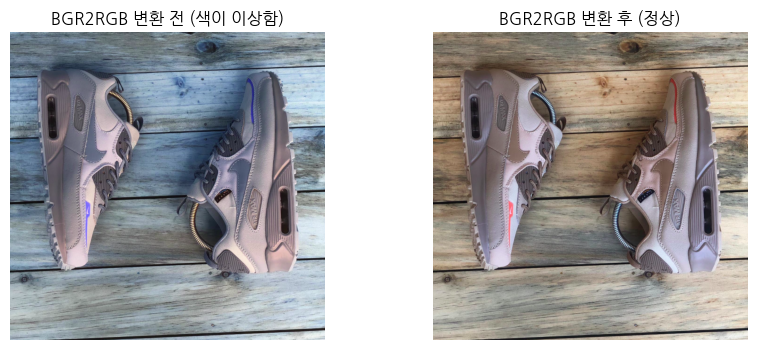

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].imshow(img)                                       # 변환 없이 그대로 → 색이 이상하다
axes[0].set_title("BGR2RGB 변환 전 (색이 이상함)")
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))                   # ① 변환 후 → 정상
axes[1].set_title("BGR2RGB 변환 후 (정상)")
axes[1].axis('off')

plt.show()

### 이미지 저장

`cv2.imwrite()` 는 배열을 **BGR 순서 그대로** 저장하면 된다.
OpenCV가 파일로 인코딩할 때도 BGR 기준으로 처리하기 때문이다.
(RGB로 변환한 배열을 저장하면 오히려 색이 뒤집힌 파일이 만들어진다.)

예를 들어 신발 색깔만 바꾸고 싶으면 바꿔서 `cv2.imwrite()`로 저장하면 됌


In [16]:
cv2.imwrite("images/desert_camo_saved.png", img)
print("저장 완료 : images/desert_camo_saved.png")

저장 완료 : images/desert_camo_saved.png


---
## 2.색공간 변환과 크기 조정  



### 2-1.그레이스케일 변환

- 컬러(3채널) → 흑백(1채널)로 바꾸면 데이터 크기가 1/3로 줄어든다.
- 색상보다 **형태·경계선**이 중요한 작업이라면 그레이스케일만으로 충분한 경우가 많다.
- MNIST 손글씨가 흑백 1채널이었던 이유도 같다.

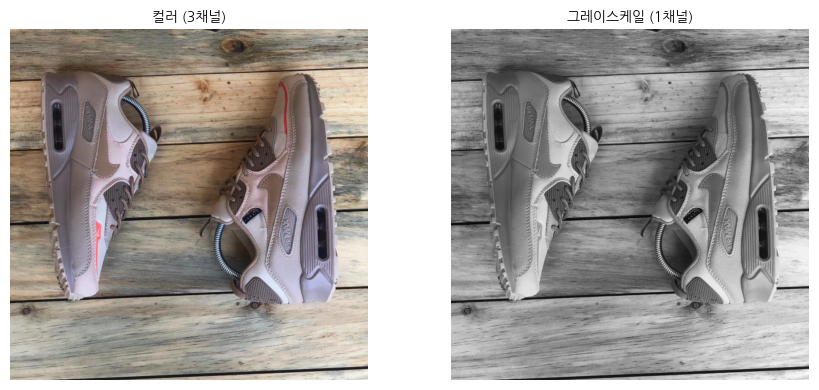

컬러 shape: (679, 693, 3) → 그레이스케일 shape: (679, 693)
데이터 크기: 1411641 바이트 → 470547 바이트


In [17]:
# ┌─ 채울 곳 ─────────────────────────────────────────
# ① 컬러(BGR)를 흑백으로 바꾸는 변환 코드  (cv2.COLOR_ 로 시작한다)
# └──────────────────────────────────────────────
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)   # ①BGR을 흑백으로 바꿔줌

show([img, gray], ["컬러 (3채널)", "그레이스케일 (1채널)"], figsize=(9, 4)) #그레이스케일이면 흑백으로 CNN DNN 사용하기 편함

print("컬러 shape:", img.shape, "→ 그레이스케일 shape:", gray.shape)
print("데이터 크기:", img.nbytes, "바이트 →", gray.nbytes, "바이트")

### 2-2. HSV 색공간과 밝기 조정

HSV는 **색상(Hue) · 채도(Saturation) · 밝기(Value)** 를 분리해 표현하는 색공간이다.
밝기(V) 채널만 조절하면 색은 유지한 채 이미지를 밝게·어둡게 만들 수 있다.

밝기 변화는 **데이터 증강(7절)에서 그대로 쓰인다.** 조명 조건이 달라져도 잘 작동하는
모델을 만들려면, 학습 데이터에 밝기가 다양한 사진이 섞여 있어야 하기 때문이다.

> 픽셀을 반복문으로 하나씩 도는 방식은 이미지가 커질수록 매우 느리다.
> **numpy 배열 연산(브로드캐스팅)** 을 쓰면 훨씬 빠르고 코드도 짧다.

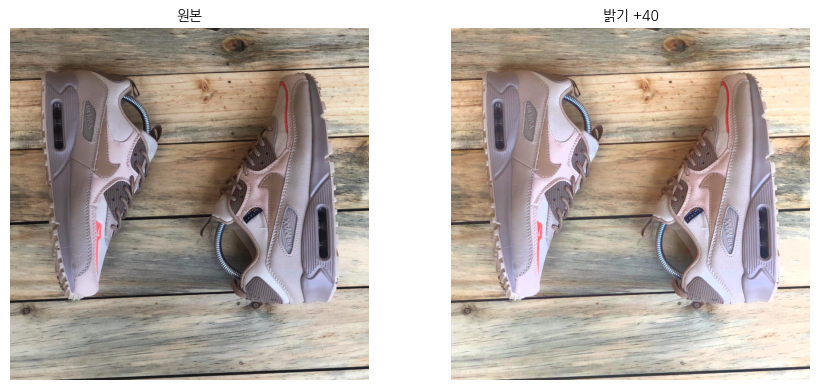

In [18]:
brighter = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

  #걍 BGR을 HSV로 바꾼 이미지를 복사함
# V(밝기) 채널에 40을 더하되, 255를 넘지 않도록 클리핑(clip)한다 V=2
# ① HSV에서 밝기(V)는 몇 번째 채널인가? (H=0, S=1, V=2)
# ② 픽셀 값이 가질 수 있는 최댓값 → 255
brighter[:, :, 2] = np.clip(brighter[:, :, 2].astype(int) + 40, 0, 255).astype(np.uint8)   # ① ②
brighter_bgr = cv2.cvtColor(brighter, cv2.COLOR_HSV2BGR)

show([img, brighter_bgr], ["원본", "밝기 +40"], figsize=(9, 4))

#### 미니 실습 1

위 코드를 참고해 이미지를 **30만큼 더 어둡게** 만들어 보자.
(V 채널에서 30을 빼되, 0 아래로 내려가지 않도록 `np.clip` 을 사용한다.)

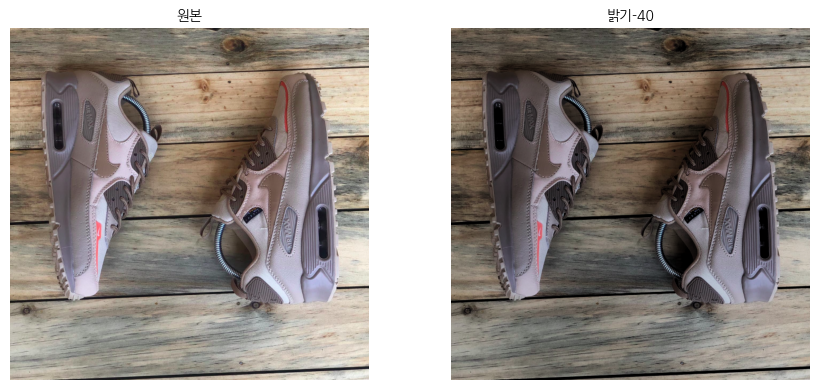

In [20]:
# [미니 실습 1] 여기에 코드를 작성하세요
# 목표 : 이미지를 30만큼 더 어둡게 만들어 원본과 나란히 출력하기
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
darker = hsv.copy()



# darker[:, :, 2] = ...
# darker_bgr = ...
# show([img, darker_bgr], ["원본", "밝기 -30"], figsize=(9, 4))

darker[:, :, 2] = np.clip(darker[:, :, 2].astype(int) - 40, 0, 255).astype(np.uint8)   # ① ②
darker_bgr = cv2.cvtColor(darker, cv2.COLOR_HSV2BGR)

show([img, darker_bgr], ["원본", "밝기-40"], figsize=(9, 4))


### 2-3. 크기 조정 (Resize)

딥러닝 모델은 **고정된 입력 크기**(예: 224×224)를 요구한다.
실제 사진 크기는 제각각이므로 모델에 넣기 전 resize는 사실상 필수다.

- 절대 크기 : `cv2.resize(img, (너비, 높이))` — **(가로, 세로) 순서**임에 주의
- 배율 지정 : `cv2.resize(img, None, fx=0.5, fy=0.5)`
- 축소는 `cv2.INTER_AREA`, 확대는 `cv2.INTER_CUBIC` / `cv2.INTER_LINEAR` 가 자연스럽다.

원본       : (679, 693, 3)
224x224    : (224, 224, 3)
50% 축소   : (340, 346, 3)


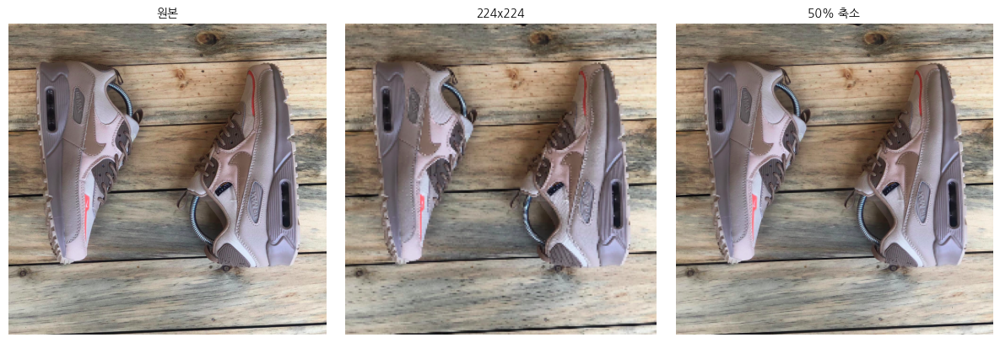

In [21]:
# ┌─ 채울 곳 ───────────────────────────────────────
# ① 대부분의 분류 모델이 쓰는 입력 크기 → (224, 224)
# ② 가로·세로 배율 : 절반으로 줄이려면?
# ③ 축소할 때 권장되는 보간법  (cv2.INTER_ 로 시작, 영역 평균 방식)
# └────────────────────────────────────────────

resized_abs   = cv2.resize(img, (224,224))   # ① (너비, 높이) 순서 — shape 출력과 반대다
resized_ratio = cv2.resize(img, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)   # ② ③

print("원본       :", img.shape)
print("224x224    :", resized_abs.shape)      # (224, 224, 3) → (높이, 너비, 채널)
print("50% 축소   :", resized_ratio.shape)    # 비율적으로 축소

show([img, resized_abs, resized_ratio], ["원본", "224x224", "50% 축소"], figsize=(12, 4))

> **자주 헷갈리는 지점**
> `cv2.resize`의 인자는 **(너비, 높이)** 이고, `img.shape`은 **(높이, 너비, 채널)** 이다.
> 정사각형이 아닌 이미지에서 두 값을 바꿔 넣으면 그림이 찌그러진다. shape을 꼭 출력해 확인하자.

---
## 3.기하 변환 : 자르기 · 반전 · 회전 · 이동

여기서 다루는 네 가지는 두 곳에서 곧바로 쓰인다.

1. **객체 탐지 결과 후처리** — 모델이 알려 준 박스 좌표로 그 부분만 잘라낸다 (3일차)
2. **데이터 증강** — 같은 사진을 반전·회전해 학습 데이터를 늘린다 (7절)

### 3-1. 자르기 (ROI 크롭)

객체 탐지 모델은 "이 위치에 이 물체가 있다"는 사각형(**바운딩 박스**)을 알려 준다.
그 좌표로 이미지의 일부만 잘라내는 것이 **ROI(Region of Interest) 크롭**이며,
구현은 파이썬 배열 슬라이싱 한 줄이다 : `이미지[y1:y2, x1:x2]`

**행(y)이 먼저, 열(x)이 나중**이라는 점이 좌표 표기 (x, y)와 반대라 자주 틀린다.

이미지 크기 : 가로 500 x 세로 667
크롭 결과 shape: (190, 200, 3)


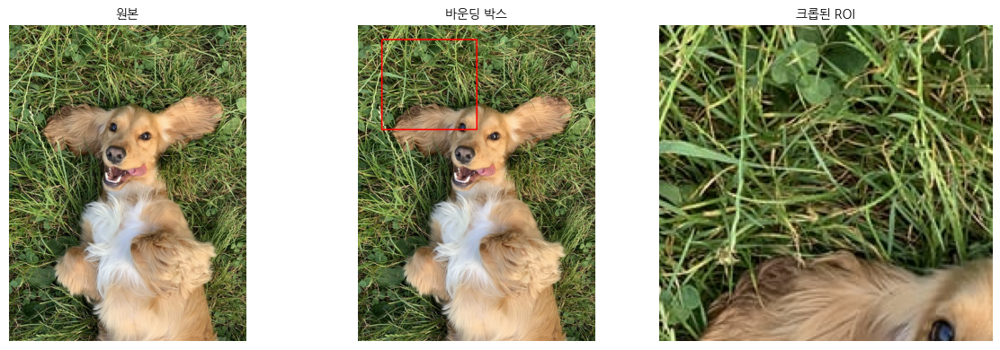

In [22]:
img_color = cv2.imread("images/dog.jpg")
h, w, _ = img_color.shape #색깔은 사용 안할 꺼라서 _ 로 처리
print("이미지 크기 : 가로", w, "x 세로", h)


# 예시
# 객체 탐지 모델이 (x1, y1, x2, y2) = (50, 30, 250, 220) 박스를 알려주었다고 가정
# 위치값을 박스로 알려줌 x1,y1이 사각형의 맨위 꼭지점 x2,y2가 사각형의 맨 끝쪽 꼭지점
x1, y1, x2, y2 = 50, 30, 250, 220   # AI보고 찾으라고 해야함

# 박스를 그려 확인
boxed = img_color.copy()
cv2.rectangle(boxed, (x1, y1), (x2, y2), (0, 0, 255), 2)   # BGR이므로 (0,0,255)가 빨강

# ① 슬라이싱 순서에 주의 : [세로범위, 가로범위] — y가 먼저다
roi = img_color[y1:y2, x1:x2]        # ①
print("크롭 결과 shape:", roi.shape)

show([img_color, boxed, roi], ["원본", "바운딩 박스", "크롭된 ROI"], figsize=(12, 4))

### 3-2. 반전 (Flip)

`cv2.flip(img, flipCode)` 한 줄이다.

| flipCode | 방향 |
|---|---|
| `1` | 좌우 반전 |
| `0` | 상하 반전 |
| `-1` | 상하좌우 동시 |

**증강에서 가장 많이 쓰는 기법**이지만, 아무 데나 쓰면 안 된다.
좌우 반전한 숫자 '2'는 더 이상 '2'가 아니고, 글자·표지판·계기판도 마찬가지다.
반전해도 의미가 유지되는 대상인지 먼저 판단해야 한다.

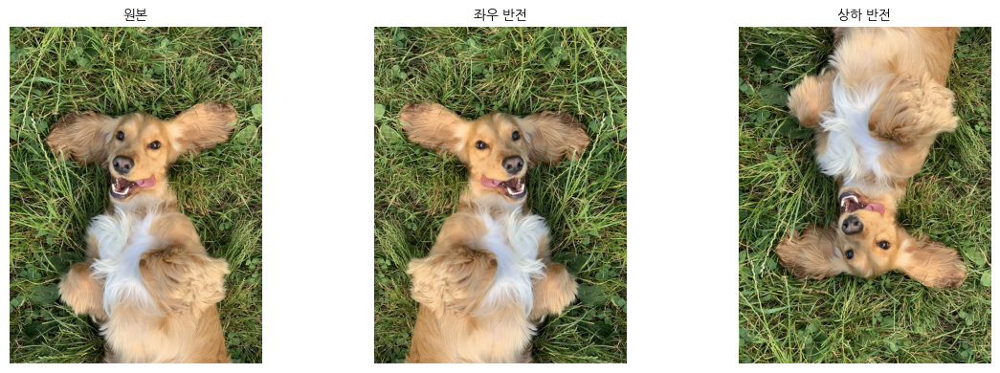

In [23]:
# ┌─ 채울 곳 ────────────────────────────────────────
# 위 표를 보고 flipCode를 채운다 (1 / 0 / -1 중 하나씩)
# ① 좌우 반전
# ② 상하 반전
#  3 -1 ==> 좌우 and 상하 반전
# └──────────────────────────────────────────────

flip_h = cv2.flip(img_color, 1)   # ① 좌우
flip_v = cv2.flip(img_color, 0)   # ② 상하

show([img_color, flip_h, flip_v], ["원본", "좌우 반전", "상하 반전"], figsize=(12, 4))

### 3-3. 회전과 이동 (Affine 변환)

회전·이동은 **변환 행렬 M**을 만들어 `cv2.warpAffine(img, M, (너비, 높이))` 에 넘긴다.

- 이동 : `M = [[1, 0, tx], [0, 1, ty]]` — tx만큼 가로로, ty만큼 세로로 민다
- 회전 : `cv2.getRotationMatrix2D(중심좌표, 각도, 배율)` 로 M을 만들어 준다

회전하면 모서리에 검은 여백이 생긴다. 증강에 쓸 때는 각도를 크게 주지 않는 것이 보통이다
(±10~15도 정도).

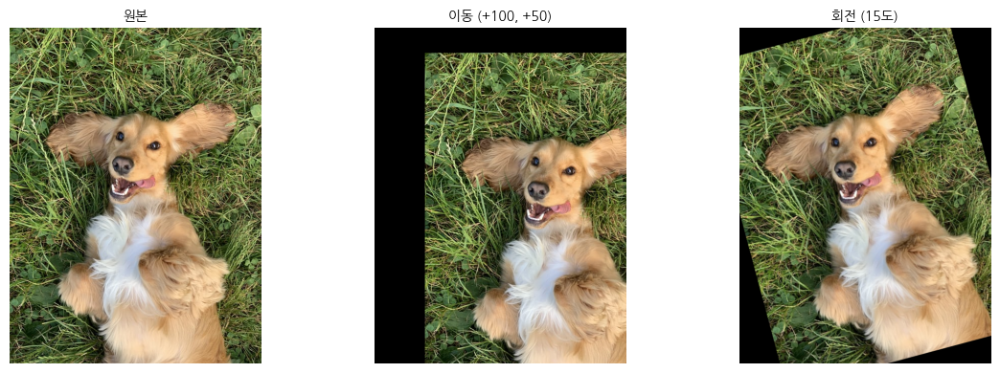

In [24]:
rows, cols = img_color.shape[:2]  #원본  (679,693,2)
#h  , w

# 이동 : 가로 +100, 세로 +50
M_translate = np.float32([[1, 0, 100],
                         [0, 1, 50]])
translated = cv2.warpAffine(img_color, M_translate, (cols, rows))

# 회전 : 이미지 중심 기준 15도, 배율 1.0
center = ((cols - 1) / 2.0, (rows - 1) / 2.0)
# ① 회전 각도(도) : 15    ② 배율 : 1.0 (크기 유지)
M_rotate = cv2.getRotationMatrix2D(center, 15, 1.0)   # ① ②
rotated = cv2.warpAffine(img_color, M_rotate, (cols, rows))

show([img_color, translated, rotated],
     ["원본", "이동 (+100, +50)", "회전 (15도)"], figsize=(12, 4))

#### 미니 실습 2

`images/dog.jpg` 의 **오른쪽 아래 1/4 영역**만 잘라내고, 그것을 **좌우 반전**해 보자.
힌트 : 잘라낼 범위는 `img[h//2:, w//2:]`

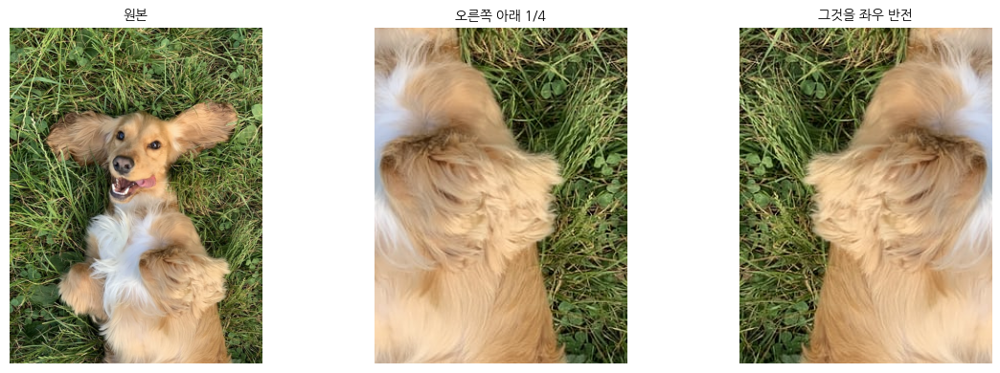

In [ ]:
# [미니 실습 2] 여기에 코드를 작성하세요
# 목표 : 오른쪽 아래 1/4 영역을 잘라내고 좌우 반전해 출력하기
# 힌트 : img_color[h//2:, w//2:]

quarter = img_color[h//2:,w//2:]
quarter_flip = cv2.flip(quarter,1)

show([img_color, quarter, quarter_flip],
      ["원본", "오른쪽 아래 1/4", "그것을 좌우 반전"], figsize=(12, 4))

---
## 4.노이즈 제거와 이진화 — 필요한 만큼만

이 절의 기법들은 **CNN을 쓰기 전 시대의 주력 도구**였다.
지금은 CNN이 특징을 스스로 찾아내므로 전처리 단계에서 이 정도까지 손댈 일은 줄었다.
그래도 다음 두 상황에서는 여전히 필요하다.

- 촬영 장비 자체가 노이즈를 많이 만들 때 (저조도 카메라, 저가 센서)
- 배경과 물체를 갈라내야 할 때 (면적 측정, 개수 세기, 라벨링 보조)

**대표 기법 하나씩만 손에 익히고, 나머지는 표로 알아 두면 충분하다.**

### 4-1. 블러링 (노이즈 제거)

| 방법 | 함수 | 언제 쓰나 |
|---|---|---|
| **가우시안 블러** | `cv2.GaussianBlur()` | **기본값.** 가까운 픽셀에 큰 가중치 → 자연스러운 흐림 |
| **중앙값 블러** | `cv2.medianBlur()` | 소금-후추(점 형태) 노이즈에 특히 강하다 |
| 평균 필터 | `cv2.blur()` | 가장 단순·빠름. 경계까지 뭉갠다 (참고) |
| 양방향 필터 | `cv2.bilateralFilter()` | 경계는 살리고 노이즈만 제거. 느리다 (참고) |

커널 크기는 **홀수**여야 한다. 클수록 많이 흐려진다.

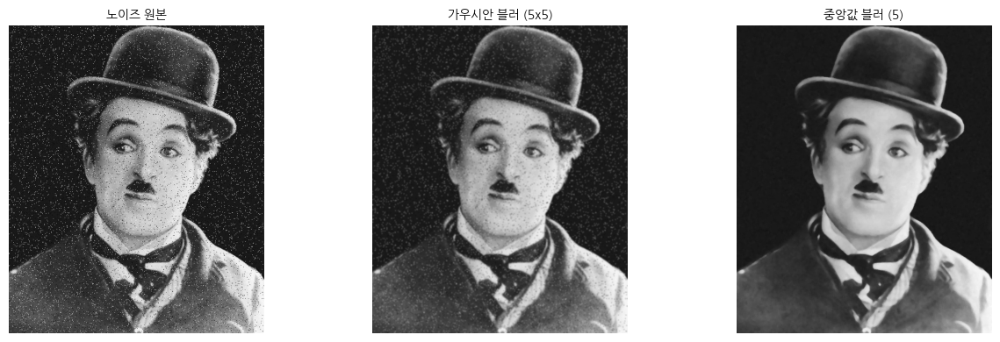

In [ ]:
noisy = cv2.imread("images/noisy_image.png")

# ┌─ 채울 곳 ───────────────────────────────────────
# ① 가우시안 커널 크기 : (5, 5)  ← 반드시 홀수
# ② 중앙값 블러의 커널 크기 : 5
# └─────────────────────────────────────────────

blur_gauss  = cv2.GaussianBlur(noisy, (5,5), 0)   # ① sigma는 0이면 자동 계산
blur_median = cv2.medianBlur(noisy, 5)      # ②

show([noisy, blur_gauss, blur_median],
     ["노이즈 원본", "가우시안 블러 (5x5)", "중앙값 블러 (5)"], figsize=(13, 4))

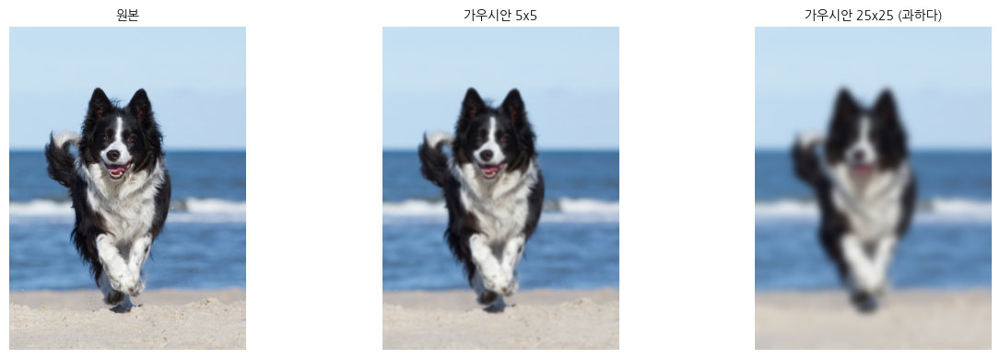

In [25]:
# 커널 크기를 키우면 어떻게 되는가 — 직접 비교해 보자
img2 = cv2.imread("images/dog_collie_beach.jpeg")

show([img2, cv2.GaussianBlur(img2, (5, 5), 0), cv2.GaussianBlur(img2, (25, 25), 0)],
     ["원본", "가우시안 5x5", "가우시안 25x25 (과하다)"], figsize=(13, 4))

> **판단 기준** : 블러는 정보를 지우는 작업이다.
> 노이즈를 지우려다 **분류에 필요한 미세한 특징까지 지우면 성능이 떨어진다.**
> 원본으로 먼저 학습해 보고, 성능이 안 나올 때 노이즈를 의심하는 순서가 안전하다.

### 4-2. 이진화 (Thresholding)

픽셀 값을 기준값과 비교해 **검정/흰색 두 그룹으로 나누는** 작업이다.
배경과 물체를 분리하는 가장 단순한 형태의 세그멘테이션이라고 볼 수 있다.

- **단순 이진화** : 고정 임계값 하나를 전체에 적용. 조명이 균일할 때 잘 된다.
- **Otsu 이진화** : 픽셀 분포를 분석해 **임계값을 자동으로 계산**한다. 기준값을 정하기 애매할 때 먼저 써 본다.

(조명이 불균일한 사진에 쓰는 **적응형 이진화**는 부록에서 다룬다.)

Otsu가 자동으로 찾은 임계값: 119.0


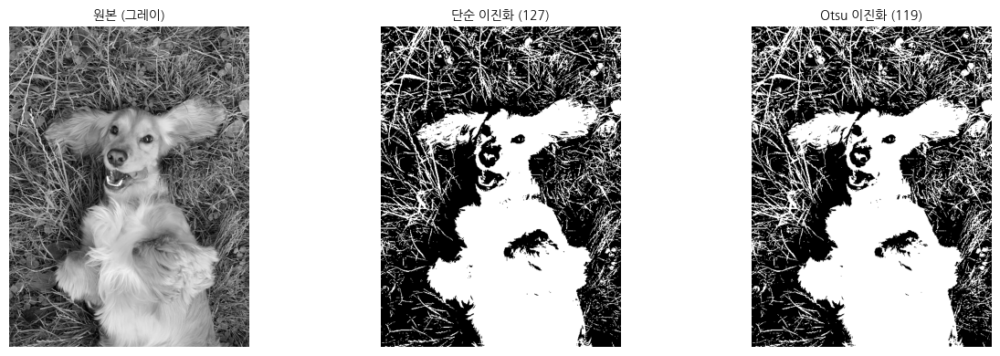

In [26]:
img_gray = cv2.imread("images/dog.jpg", cv2.IMREAD_GRAYSCALE)

# 단순 이진화 — 임계값 127을 사람이 지정
# ① 고정 임계값 : 0~255의 한가운데 값 127
# ② 임계값을 데이터에서 자동으로 찾게 하는 플래그 (cv2.THRESH_ 로 시작)
_, th_binary = cv2.threshold(img_gray,127, 255, cv2.THRESH_BINARY)   # ① 회색 이미지를 이진으로 바꿔줌 그럼 경계가 뚜렷해짐


# Otsu 이진화 — 임계값을 데이터에서 자동 결정 (첫 인자 자리의 0은 무시된다)
otsu_thresh, th_otsu = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)   # ②
print("Otsu가 자동으로 찾은 임계값:", otsu_thresh)

show([img_gray, th_binary, th_otsu],
     ["원본 (그레이)", "단순 이진화 (127)", f"Otsu 이진화 ({otsu_thresh:.0f})"], figsize=(13, 4))

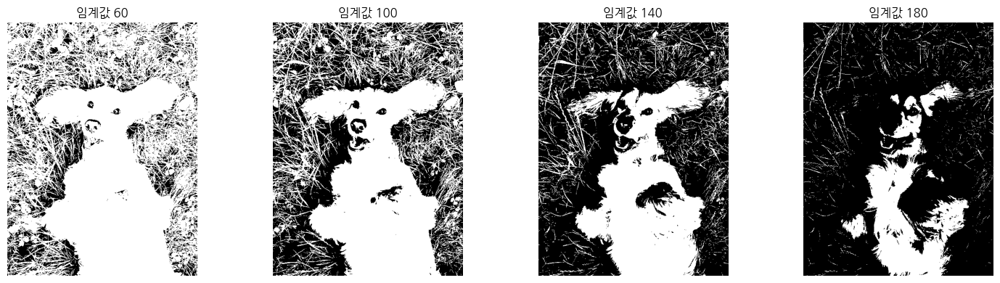

In [27]:
# 임계값을 바꾸면 결과가 얼마나 달라지는가
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
for ax, t in zip(axes, [60, 100, 140, 180]):
    _, th = cv2.threshold(img_gray, t, 255, cv2.THRESH_BINARY)
    ax.imshow(th, cmap='gray'); ax.set_title(f"임계값 {t}"); ax.axis('off')
plt.tight_layout(); plt.show()

---
## 5.엣지 검출 — Canny 중심  

엣지(edge)는 밝기가 급격히 변하는 경계선으로, 물체의 윤곽을 나타낸다.
딥러닝 이전에는 사람이 이런 특징을 직접 설계했다.

**CNN이 하는 일이 바로 이것을 자동으로 배우는 것이다.**
2일차에 CNN의 첫 번째 층이 학습한 필터를 보면 여기서 본 엣지 검출기와 매우 비슷하게 생겼다.
그 연결을 눈으로 확인하는 것이 이 절의 목적이다.

실무에서 직접 쓸 때는 **Canny 하나면 충분**하다.
(Sobel · Laplacian 등 다른 방식은 부록에서 비교한다.)

걍 경계선 찾는다 --> CANNY


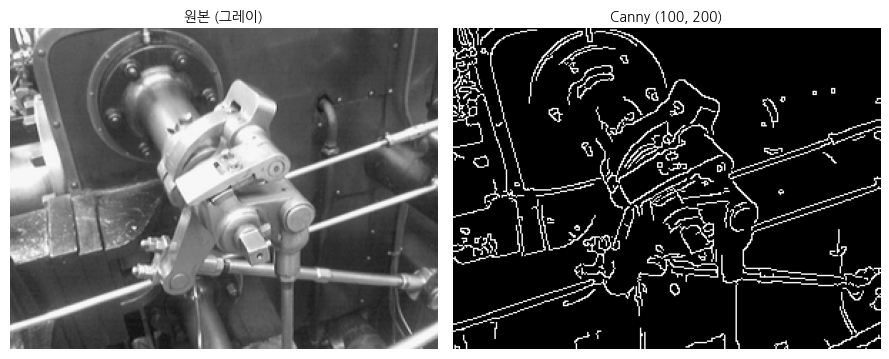

In [ ]:
img_edge = cv2.imread("images/valve_original.png", cv2.IMREAD_GRAYSCALE)
img_blur = cv2.GaussianBlur(img_edge, (3, 3), 0)   # 노이즈를 먼저 지우고 엣지를 찾는 것이 기본

# ① minVal 100  ② maxVal 200 — 값을 낮출수록 선이 많이 잡힌다
canny = cv2.Canny(img_blur, 100, 200)            # ① ②

show([img_edge, canny], ["원본 (그레이)", "Canny (100, 200)"], figsize=(9, 4))

### 두 임계값은 무슨 뜻인가

Canny는 두 개의 문턱을 쓴다.

- **maxVal 이상** : 확실한 엣지로 채택
- **minVal 이하** : 버림
- **그 사이** : 확실한 엣지와 이어져 있으면 채택, 아니면 버림

즉 값을 낮출수록 선이 많이(잡음까지) 잡히고, 높일수록 굵고 확실한 선만 남는다.

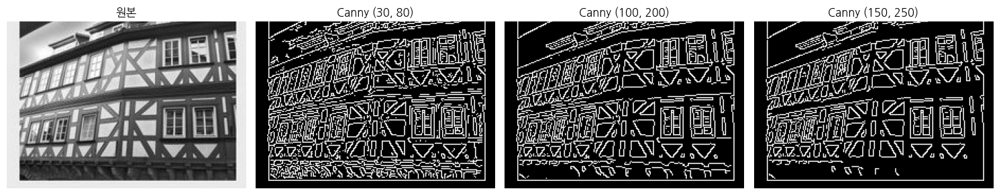

In [ ]:
img_canny_src = cv2.imread("images/canny_detector_image.jpeg", cv2.IMREAD_GRAYSCALE)

fig, axes = plt.subplots(1, 4, figsize=(15, 4))
settings = [(30, 80), (100, 200), (150, 250), (200, 300)]
axes[0].imshow(img_canny_src, cmap='gray'); axes[0].set_title("원본"); axes[0].axis('off')
for ax, (lo, hi) in zip(axes[1:], settings[:3]):
    ax.imshow(cv2.Canny(img_canny_src, lo, hi), cmap='gray')
    ax.set_title(f"Canny ({lo}, {hi})"); ax.axis('off')
plt.tight_layout(); plt.show()

---
## 6.정규화 — 기계학습 모델이 먹을 수 있는 형태로 만들기  

여기서부터가 **딥러닝 모델에 직접 연결되는 부분**이다.

이미지의 픽셀 값은 `0~255` 정수(uint8)다. 하지만 신경망은 이 값을 그대로 좋아하지 않는다.

- 입력 값이 크면 가중치 갱신 폭이 들쭉날쭉해져 **학습이 불안정**해진다
- 값의 범위를 `0~1` 또는 `-1~1` 로 맞추면 **수렴이 빠르고 안정적**이다

3차시 심장병 예측에서 `StandardScaler`를 썼던 것과 같은 이유다.
이미지는 모든 픽셀이 이미 같은 범위(0~255)이므로, 보통 **255로 나누기만 하면 된다.**

In [ ]:
sample = cv2.imread("images/dog.jpg")
sample = cv2.resize(sample, (224, 224))

print("[변환 전]")
print("  dtype :", sample.dtype)
print("  범위  :", sample.min(), "~", sample.max())
print("  평균  :", round(float(sample.mean()), 2))

# ┌─ 채울 곳 ──────────────────────────────────────────
# ① 실수형 dtype 이름 (문자열) — 딥러닝에서 표준으로 쓰는 32비트 실수
# ② 픽셀이 가질 수 있는 최댓값으로 나누어 0~1 로 만든다
#    순서가 중요하다. 형 변환을 먼저 하지 않으면 정수 나눗셈이 되어 전부 0이 된다.
# └────────────────────────────────────────────────

# 0~1 정규화 : float으로 바꾼 뒤 255로 나눈다
normalized = sample.astype("float32") / 255.0   # ① ②

print("\n[변환 후]")
print("  dtype :", normalized.dtype)
print("  범위  :", round(float(normalized.min()), 3), "~", round(float(normalized.max()), 3))
print("  평균  :", round(float(normalized.mean()), 4))

[변환 전]
  dtype : uint8
  범위  : 0 ~ 255
  평균  : 109.97

[변환 후]
  dtype : float32
  범위  : 0.0 ~ 1.0
  평균  : 0.4313


> **자주 하는 실수** : `sample / 255` 를 먼저 하지 않고 `astype("float32")` 를 빠뜨리면
> uint8끼리의 정수 나눗셈이 되어 값이 전부 0이 되어 버린다. **형 변환 → 나누기 순서**를 지키자.

0~1   범위   0.00 ~  1.00   평균  0.431
-1~1  범위  -1.00 ~  1.00   평균 -0.137


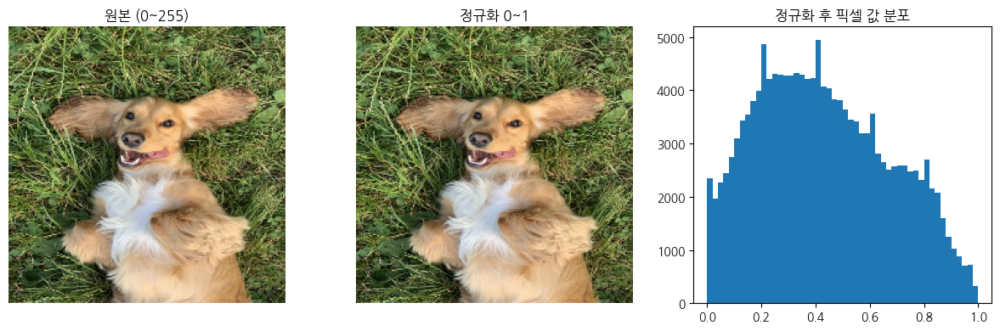

In [ ]:
# 정규화 방식 두 가지 비교
norm_01   = sample.astype("float32") / 255.0            # 0 ~ 1   (가장 일반적)
norm_11   = (sample.astype("float32") / 127.5) - 1.0    # -1 ~ 1  (MobileNet 계열이 쓰는 방식)

for name, arr in [("0~1  ", norm_01), ("-1~1 ", norm_11)]:
    print(f"{name} 범위 {arr.min():6.2f} ~ {arr.max():5.2f}   평균 {arr.mean():6.3f}")

# 그림 자체는 달라지지 않는다 — 값의 스케일만 바뀐다
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(cv2.cvtColor(sample, cv2.COLOR_BGR2RGB));  axes[0].set_title("원본 (0~255)")
axes[1].imshow(cv2.cvtColor(norm_01, cv2.COLOR_BGR2RGB)); axes[1].set_title("정규화 0~1")
axes[2].hist(norm_01.ravel(), bins=50); axes[2].set_title("정규화 후 픽셀 값 분포")
for ax in axes[:2]:
    ax.axis('off')
plt.tight_layout(); plt.show()

> **중요 규칙**
> 학습할 때 쓴 정규화 방식은 **추론할 때도 똑같이** 적용해야 한다.
> 학습은 0~1로 했는데 추론에서 0~255를 넣으면, 정확도 수치는 멀쩡한데 실전에서만 틀린다.
> 2일차 12차시 배포 패키지에 `config.json`으로 정규화 방식을 함께 저장하는 이유가 이것이다.

---
## 7.데이터 증강 — 한 장을 여러 장으로  

딥러닝의 성능은 데이터 양에 크게 좌우된다. 그런데 현장에서 사진 수천 장을 모으는 일은 쉽지 않다.

**데이터 증강(Data Augmentation)** 은 가지고 있는 사진에 작은 변형을 주어
"조금씩 다른 새 사진"을 만들어 내는 기법이다. 정답 라벨은 그대로 유지된다.

| 변형 | 모방하는 실제 상황 |
|---|---|
| 좌우 반전 | 물체가 반대 방향을 향한 경우 |
| 회전 (±15도) | 카메라가 기울어진 경우 |
| 이동 | 물체가 화면 중앙에 있지 않은 경우 |
| 밝기 조정 | 조명이 어둡거나 밝은 경우 |
| 확대·축소 | 카메라와의 거리가 다른 경우 |

지금까지 배운 기법들이 전부 여기서 다시 등장한다.

In [ ]:
def augment(img, seed=None):
    """이미지 한 장에 무작위 변형을 적용해 새 이미지를 만든다."""
    rng = np.random.default_rng(seed)
    out = img.copy()
    h, w = out.shape[:2]

    # 1) 50% 확률로 좌우 반전
    if rng.random() < 0.5:          # ① 50% 확률 → 0.5
        out = cv2.flip(out, 1)    # ② 좌우 반전 flipCode

    # 2) -15 ~ +15도 무작위 회전
    angle = rng.uniform(-15, 15)  # ③ 회전 각도 범위
    M = cv2.getRotationMatrix2D(((w - 1) / 2.0, (h - 1) / 2.0), angle, 1.0)
    out = cv2.warpAffine(out, M, (w, h), borderMode=cv2.BORDER_REFLECT)

    # 3) 가로·세로 최대 10% 이동
    tx, ty = rng.integers(-w // 10, w // 10), rng.integers(-h // 10, h // 10)
    M = np.float32([[1, 0, tx], [0, 1, ty]])
    out = cv2.warpAffine(out, M, (w, h), borderMode=cv2.BORDER_REFLECT)

    # 4) 밝기 -40 ~ +40 조정 (HSV의 V 채널)
    hsv = cv2.cvtColor(out, cv2.COLOR_BGR2HSV)
    shift = rng.integers(-40, 40)
    hsv[:, :, 2] = np.clip(hsv[:, :, 2].astype(int) + shift, 0, 255).astype(np.uint8)
    out = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

    return out

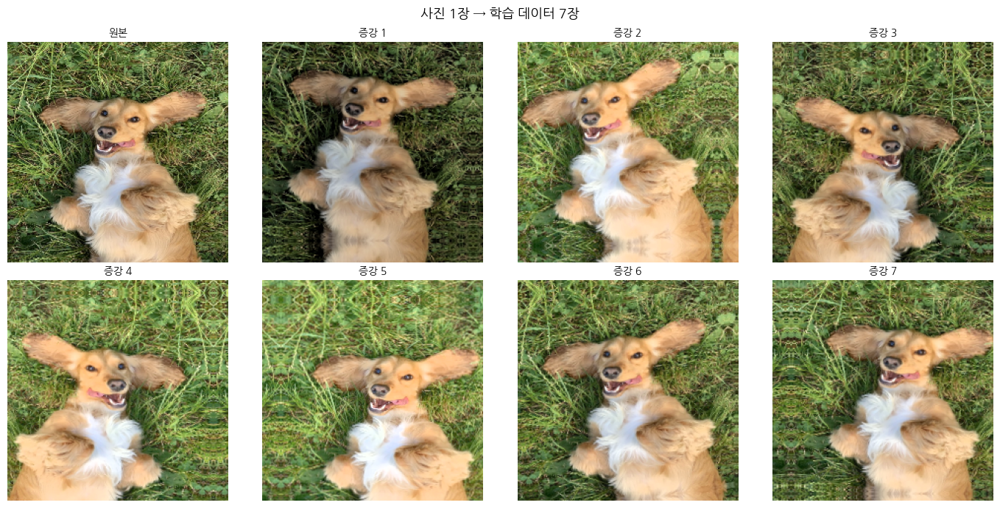

In [ ]:
base = cv2.resize(cv2.imread("images/dog.jpg"), (224, 224))

fig, axes = plt.subplots(2, 4, figsize=(14, 7))
axes[0, 0].imshow(cv2.cvtColor(base, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("원본", fontsize=10); axes[0, 0].axis('off')

for i, ax in enumerate(axes.ravel()[1:]):
    ax.imshow(cv2.cvtColor(augment(base, seed=i), cv2.COLOR_BGR2RGB))
    ax.set_title(f"증강 {i+1}", fontsize=10); ax.axis('off')

plt.suptitle("사진 1장 → 학습 데이터 7장", fontsize=13)
plt.tight_layout(); plt.show()

### 증강할 때 반드시 지켜야 할 두 가지

**① 라벨의 의미가 유지되는 변형만 쓴다**
좌우 반전한 '2'는 '2'가 아니다. 숫자·글자·좌우가 구분되는 부품에는 flip을 쓰면 안 된다.
품질 검사에서 결함 위치가 중요한 경우 이동·회전도 신중해야 한다.

**② 학습 데이터에만 적용한다**
검증·테스트 데이터를 증강하면 평가 결과가 왜곡된다.
시험 문제를 바꿔치기해 놓고 점수를 재는 것과 같다.

> 2일차부터는 이 작업을 직접 짜지 않고 `ImageDataGenerator` 나 `tf.keras.layers.RandomFlip` 이
> 대신 해 준다. 하지만 **내부에서 무슨 일이 일어나는지**는 방금 본 그대로다.

In [ ]:
# Keras에서는 같은 일을 이렇게 쓴다 (2일차 미리보기)
#
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
#
# train_gen = ImageDataGenerator(
#     rescale=1/255.,          # ← 6절의 정규화
#     rotation_range=15,       # ← 회전
#     width_shift_range=0.1,   # ← 이동
#     height_shift_range=0.1,
#     brightness_range=[0.8, 1.2],   # ← 밝기
#     horizontal_flip=True,    # ← 좌우 반전
# )
print("오늘 손으로 짠 함수가 곧 위 설정 한 덩어리와 같다.")

---
## 8.전처리 파이프라인 함수로 묶기

지금까지 배운 것을 **하나의 함수**로 묶는다. 이것이 오늘의 최종 결과물이다.

```
원본 이미지  →  ① 읽기  →  ② BGR→RGB  →  ③ resize  →  ④ 정규화  →  모델 입력
```

함수로 묶어 두면 좋은 점이 분명하다.
**학습할 때와 추론할 때 똑같은 처리가 적용된다는 보장**이 생긴다.
전처리를 여기저기 흩어 두면 둘이 어긋나기 쉽고, 그때 생기는 오류는 찾기가 매우 어렵다.

In [ ]:
# ┌─ 채울 곳 ─────────────────────────────────────────
#  오늘의 최종 결과물. 6절까지 배운 내용을 순서대로 조립한다.
# ① BGR을 RGB로 바꾸는 변환 코드
# ② 목표 크기 : 함수 인자로 받은 img_size 를 그대로 넘긴다
# ③ 실수형 변환 후 나눌 값 (픽셀 최댓값)
# └───────────────────────────────────────────────

IMG_SIZE = (224, 224)     # 모델이 요구하는 입력 크기

def preprocess(path, img_size=IMG_SIZE, to_rgb=True, normalize=True):
    """이미지 경로 → 모델 입력용 배열 (높이, 너비, 채널)"""
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f"이미지를 읽을 수 없다: {path}")

    if to_rgb:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)                   # ① 모델은 RGB를 기대한다

    img = cv2.resize(img,img_size, interpolation=cv2.INTER_AREA)   # ②

    if normalize:
        img = img.astype("float32") / 255.0             # ③ 0 ~ 1 로 정규화

    return img


x = preprocess("images/dog.jpg")
print("결과 shape :", x.shape)
print("결과 dtype :", x.dtype)
print("값 범위    :", round(float(x.min()), 3), "~", round(float(x.max()), 3))

결과 shape : (224, 224, 3)
결과 dtype : float32
값 범위    : 0.0 ~ 0.996


### 여러 장을 한 번에 — 배치(batch) 만들기

모델은 보통 이미지를 한 장씩이 아니라 **여러 장 묶음(batch)** 으로 받는다.
배열 앞에 이미지 개수 축이 하나 더 붙어 `(N, 높이, 너비, 채널)` 모양이 된다.

사용할 파일: ['canny_detector_image.jpeg', 'dog.jpg', 'dog_collie_beach.jpeg', 'opencv_image.jpeg']

배치 shape: (4, 224, 224, 3)   ← (장수, 높이, 너비, 채널)


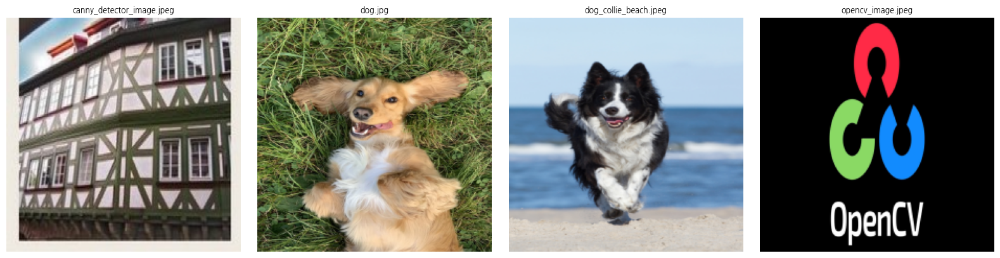

In [ ]:
import glob
#여러장을 한번에 받을 때
paths = sorted(glob.glob("images/*.jpg") + glob.glob("images/*.jpeg"))[:4]
print("사용할 파일:", [os.path.basename(p) for p in paths])

batch = np.stack([preprocess(p) for p in paths])      # 리스트 → 배열로 쌓기

print("\n배치 shape:", batch.shape, "  ← (장수, 높이, 너비, 채널)")

fig, axes = plt.subplots(1, len(paths), figsize=(4 * len(paths), 4))
for ax, im, p in zip(axes, batch, paths):
    ax.imshow(im)                          # 이미 RGB + 0~1 이므로 그대로 출력 가능
    ax.set_title(os.path.basename(p), fontsize=9); ax.axis('off')
plt.tight_layout(); plt.show()

#### 미니 실습 3

`preprocess()` 를 참고해, **증강까지 포함한 학습용 전처리 함수** `preprocess_train()` 을 만들어 보자.
`augment()` 를 resize 이후·정규화 이전에 끼워 넣으면 된다.

> 왜 정규화 **이전**인가? `augment()` 는 `cv2` 함수들을 쓰는데, 이들은 0~255 uint8을 전제로 동작한다.

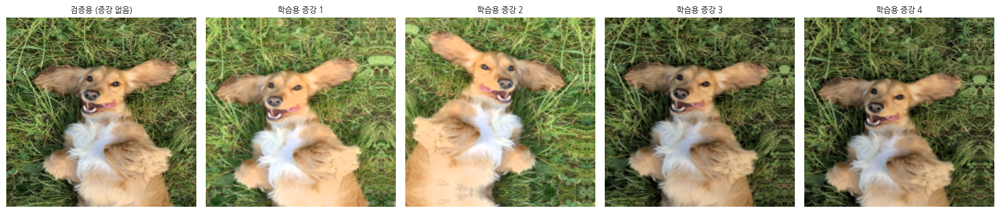

In [ ]:
# [미니 실습 3] 여기에 코드를 작성하세요
# 목표 : augment()를 포함한 학습용 전처리 함수 만들기
# 순서 : imread → resize → augment → BGR2RGB → 정규화

def preprocess_train(path, img_size=IMG_SIZE, seed=None):
    """학습용 : 증강을 포함한 전처리"""
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(path)

    # 여기에 나머지 단계를 작성한다
    img = cv2.resize(img,img_size,interpolation=cv2.INTER_AREA)
    img = augment(img,seed=None)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img.astype("float32") / 255.0
    return img


# 완성한 뒤 아래 주석을 풀어 결과를 확인하자
fig, axes = plt.subplots(1, 5, figsize=(16, 3.5))
axes[0].imshow(preprocess("images/dog.jpg")); axes[0].set_title("검증용 (증강 없음)", fontsize=9)
for i, ax in enumerate(axes[1:]):
    ax.imshow(preprocess_train("images/dog.jpg", seed=i))
    ax.set_title(f"학습용 증강 {i+1}", fontsize=9)
for ax in axes:
    ax.axis('off')
plt.tight_layout(); plt.show()

---
## 9. 정리

| 오늘 배운 기법 | 모델 개발에서의 쓰임 | 다시 만나는 곳 |
|---|---|---|
| BGR ↔ RGB 변환 | 모델이 기대하는 채널 순서 맞추기 | 3일차 YOLO 추론 |
| 그레이스케일 / HSV | 채널 수 축소, 색 기반 필터링, 밝기 증강 | 7절 증강 |
| **Resize** | 모델 고정 입력 크기로 통일 | 2·3일차 전 실습 |
| **기하 변환 (자르기·반전·회전)** | 증강, 탐지 결과 후처리 | 7절, 3일차 ROI 크롭 |
| 블러링 · 이진화 | 노이즈 정제, 배경/전경 분리 | 필요할 때만 |
| 엣지 검출 | CNN 첫 층이 학습하는 것과 같은 일 | 2일차 7차시 필터 시각화 |
| **정규화** | 학습 안정화 — 사실상 필수 | 2·3일차 전 실습 |
| **데이터 증강** | 적은 데이터로 과적합 줄이기 | 2일차 8~11차시 |
| **전처리 파이프라인 함수** | 학습·추론 처리 일치 보장 | 2일차 12차시 배포 |

### 오늘의 결론 세 줄

1. 이미지는 숫자 배열이고, 전처리는 그 배열의 **모양과 값 범위를 모델에 맞추는 일**이다.
2. 모델 성능이 이상할 때 **가장 먼저 의심할 곳은 모델 구조가 아니라 전처리**다.
3. 학습에 쓴 전처리와 추론에 쓸 전처리는 **반드시 같아야 한다.**



---
# 부록 (선택 · 시간이 남거나 관심 있을 때)

본문에서 대표 기법만 다루었다. 여기서는 나머지 방식들을 비교만 해 둔다.
**수업 시간에 반드시 다룰 필요는 없다.**

### 부록 A. 적응형 이진화 — 조명이 불균일할 때

이미지를 작은 영역으로 나누어 **영역마다 다른 임계값**을 적용한다.
한쪽만 그늘진 사진, 조명이 고르지 않은 검사 이미지에서 단순 이진화보다 훨씬 낫다.

In [ ]:
img_gray2 = cv2.imread("images/airforce_grey.png", cv2.IMREAD_GRAYSCALE)

_, th_simple = cv2.threshold(img_gray2, 127, 255, cv2.THRESH_BINARY)
th_mean  = cv2.adaptiveThreshold(img_gray2, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                 cv2.THRESH_BINARY, 25, 5)
th_gauss = cv2.adaptiveThreshold(img_gray2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                 cv2.THRESH_BINARY, 25, 5)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for ax, im, t in zip(axes, [img_gray2, th_simple, th_mean, th_gauss],
                     ["원본", "단순 이진화(127)", "적응형(평균)", "적응형(가우시안)"]):
    ax.imshow(im, cmap='gray'); ax.set_title(t, fontsize=10); ax.axis('off')
plt.tight_layout(); plt.show()

### 부록 B. Sobel · Laplacian — 엣지 검출의 다른 방식

| 방법 | 원리 | 특징 |
|---|---|---|
| Sobel | 1차 미분 (밝기의 기울기) | 방향(x/y) 정보를 얻을 수 있다. 노이즈에 민감 |
| Laplacian | 2차 미분 | 얇고 날카롭게 검출. 노이즈에 매우 민감 |
| Canny | 위 과정 + 비최대 억제 + 히스테리시스 | 가장 정교. 실무 표준 |

In [ ]:
sobel_x   = cv2.Sobel(img_blur, cv2.CV_64F, 1, 0, ksize=5)   # 세로 방향 경계
sobel_y   = cv2.Sobel(img_blur, cv2.CV_64F, 0, 1, ksize=5)   # 가로 방향 경계
laplacian = cv2.Laplacian(img_blur, cv2.CV_64F)

fig, axes = plt.subplots(1, 5, figsize=(19, 4))
for ax, im, t in zip(axes, [img_blur, sobel_x, sobel_y, laplacian, canny],
                     ["원본", "Sobel X", "Sobel Y", "Laplacian", "Canny"]):
    ax.imshow(im, cmap='gray'); ax.set_title(t, fontsize=10); ax.axis('off')
plt.tight_layout(); plt.show()

### 부록 C. 패치(타일) 분할 — 고해상도 이미지 다루기

큰 이미지를 작은 조각으로 나누어 각각 모델에 넣는 방식이다.
4K 검사 이미지에서 작은 결함을 찾을 때 실제로 쓰인다.
통째로 224×224로 줄이면 작은 결함이 사라져 버리기 때문이다.

In [ ]:
patch_size = 150
patches = []
for y in range(0, h - patch_size + 1, patch_size):
    for x in range(0, w - patch_size + 1, patch_size):
        patches.append(img_color[y:y + patch_size, x:x + patch_size])

print(f"{len(patches)}개의 패치로 분할됨")

n = min(4, len(patches))
fig, axes = plt.subplots(1, n, figsize=(3 * n, 3))
for ax, patch in zip(axes, patches[:n]):
    ax.imshow(cv2.cvtColor(patch, cv2.COLOR_BGR2RGB)); ax.axis('off')
plt.tight_layout(); plt.show()

### 부록 D. 이미지 합성 — add vs addWeighted

| 함수 | 목적 | 결과 |
|---|---|---|
| `cv2.add()` | 픽셀 값을 단순히 더한다 | 전체가 밝아진다 |
| `cv2.addWeighted()` | 두 이미지를 비율대로 혼합 | 자연스러운 오버레이 |

탐지 결과 마스크를 원본 위에 반투명하게 겹쳐 보여줄 때 `addWeighted`를 쓴다.

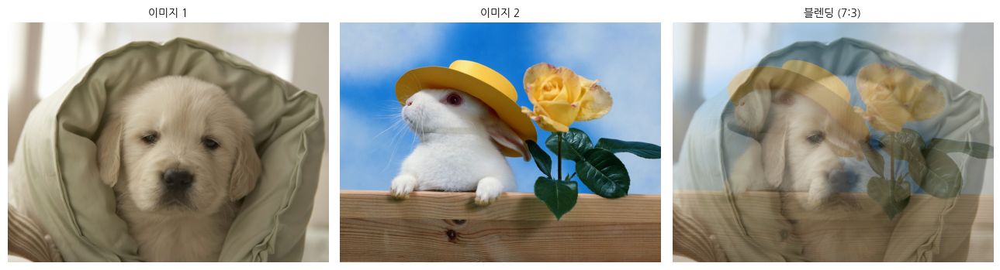

In [28]:
img1 = cv2.imread("images/puppy.jpeg")
img2 = cv2.imread("images/ratwithhat.jpeg")
img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))   # 두 이미지 크기를 맞춘다

blended = cv2.addWeighted(img1, 0.7, img2, 0.3, 0)

show([img1, img2, blended], ["이미지 1", "이미지 2", "블렌딩 (7:3)"], figsize=(13, 4))